#HOUSE IN MELBOURNE



```
INFORMASI DATA

Some Key Details

Suburb: Suburb
Address: Address
Rooms: Number of rooms
Price: Price in Australian dollars

Method:
S - property sold;
SP - property sold prior;
PI - property passed in;
PN - sold prior not disclosed;
SN - sold not disclosed;
NB - no bid;
VB - vendor bid;
W - withdrawn prior to auction;
SA - sold after auction;
SS - sold after auction price not disclosed.
N/A - price or highest bid not available.

Type:
br - bedroom(s);
h - house,cottage,villa, semi,terrace;
u - unit, duplex;
t - townhouse;
dev site - development site;
o res - other residential.
SellerG: Real Estate Agent
Date: Date sold
Distance: Distance from CBD in Kilometres
Regionname: General Region (West, North West, North, North east …etc)
Propertycount: Number of properties that exist in the suburb.
Bedroom2 : Scraped # of Bedrooms (from different source)
Bathroom: Number of Bathrooms
Car: Number of carspots
Landsize: Land Size in Metres
BuildingArea: Building Size in Metres
YearBuilt: Year the house was built
CouncilArea: Governing council for the area
Lattitude: Self explanitory

Longtitude: Self explanitory
```



## IMPORT LIBRARY


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
pd.set_option('display.max_columns', None)

## GATHERING DATA

In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload()

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d anthonypino/melbourne-housing-market

In [ ]:
!unzip '/content/melbourne-housing-market.zip'

In [ ]:
df = pd.read_csv('/content/Melbourne_housing_FULL.csv')
df.head()

## ASSESING DATA

In [ ]:
df.info()

tipe data tidak sesuai = date , YearBuilt, Bathroom,  Postcode, Bedroom2, Bathroom,  Car

In [ ]:
missValue = (df.isna().mean()*100).round(2)
missValue

In [ ]:
df.duplicated().sum()

##CLEANING DATA


In [ ]:
#mengubah tipe data
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
colRevisi = ['YearBuilt', 'Bathroom', 'Postcode', 'Bedroom2', 'Car','Propertycount']
df[colRevisi] = df[colRevisi].astype('Int64', errors='ignore')


In [ ]:
df.info()



```
Bedroom2         23.57
Bathroom         23.60
Car              25.04
Landsize         33.88
BuildingArea     60.58
YearBuilt        55.39
Lattitude        22.88
Longtitude       22.88
Price            21.83
```



In [ ]:
def hisPlot(df,columns):

  n_rows = (len(columns) + 2) // 3

  plt.figure(figsize=(15, n_rows*5))

  for i, column in enumerate(columns,1):
    plt.subplot(n_rows,3,i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribusi {column}')

  plt.tight_layout()
  plt.show()

hisCol = ['Price','YearBuilt', 'Bathroom', 'Bedroom2', 'Car','Propertycount']
hisPlot(df, hisCol)



In [ ]:
df['Price'].fillna(df['Price'].median(),inplace=True)
df['Bedroom2'].fillna(df['Bedroom2'].median(),inplace=True)
df['Bathroom'].fillna(df['Bathroom'].median(),inplace=True)
df['Car'].fillna(df['Car'].median(),inplace=True)
df['Lattitude'].fillna(df['Lattitude'].median(),inplace=True)
df['Longtitude'].fillna(df['Longtitude'].median(),inplace=True)

In [ ]:
df['Landsize'].fillna(df['Landsize'].mean(),inplace=True)
df['BuildingArea'].fillna(df['BuildingArea'].mean(),inplace=True)



In [ ]:
missValue

Suburb            0.00
Address           0.00
Rooms             0.00
Type              0.00
Price            21.83
Method            0.00
SellerG           0.00
Date              0.00
Distance          0.00
Postcode          0.00
Bedroom2         23.57
Bathroom         23.60
Car              25.04
Landsize         33.88
BuildingArea     60.58
YearBuilt        55.39
CouncilArea       0.01
Lattitude        22.88
Longtitude       22.88
Regionname        0.01
Propertycount     0.01
dtype: float64

In [ ]:
df.isna().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price                0
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2             0
Bathroom             0
Car                  0
Landsize             0
BuildingArea         0
YearBuilt        19306
CouncilArea          3
Lattitude            0
Longtitude           0
Regionname           3
Propertycount        3
dtype: int64

In [ ]:
df['YearBuilt'].fillna(df['YearBuilt'].median(), inplace =True)

In [ ]:
df['Rooms'] = df['Rooms'].astype('int64')

In [ ]:
df.drop_duplicates(inplace =True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34856 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         34856 non-null  object        
 1   Address        34856 non-null  object        
 2   Rooms          34856 non-null  int64         
 3   Type           34856 non-null  object        
 4   Price          34856 non-null  float64       
 5   Method         34856 non-null  object        
 6   SellerG        34856 non-null  object        
 7   Date           34856 non-null  datetime64[ns]
 8   Distance       34855 non-null  float64       
 9   Postcode       34855 non-null  Int64         
 10  Bedroom2       34856 non-null  Int64         
 11  Bathroom       34856 non-null  Int64         
 12  Car            34856 non-null  Int64         
 13  Landsize       34856 non-null  float64       
 14  BuildingArea   34856 non-null  float64       
 15  YearBuilt      3485

In [ ]:
df.isna().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         1
Postcode         1
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      3
Lattitude        0
Longtitude       0
Regionname       3
Propertycount    3
dtype: int64

In [ ]:
dropcolMiss = ['Distance', 'Postcode',
              'CouncilArea', 'Regionname', 'Propertycount']

In [ ]:
df.dropna(subset = dropcolMiss, inplace= True)

In [ ]:
df.isna().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

## EDA

In [ ]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,870000.0,SS,Jellis,2016-03-09,2.5,3067,2,1,1,126.0,160.2564,1970,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067,2,1,1,202.0,160.2564,1970,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067,2,1,0,156.0,79.0000,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
3,Abbotsford,18/659 Victoria St,3,u,870000.0,VB,Rounds,2016-04-02,2.5,3067,3,2,1,0.0,160.2564,1970,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067,3,2,0,134.0,150.0000,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Rooms,34853.0,3.031073,0.969957,1.0,2.0,3.0,4.0,16.0
Price,34853.0,1010867.13138,572024.430111,85000.0,695000.0,870000.0,1150000.0,11200000.0
Distance,34853.0,11.185083,6.789043,0.0,6.4,10.3,14.0,48.1
Postcode,34853.0,3116.065217,109.027105,3000.0,3051.0,3103.0,3156.0,3978.0
Bedroom2,34853.0,3.0647,0.858139,0.0,3.0,3.0,3.0,30.0
Bathroom,34853.0,1.713281,0.65275,0.0,1.0,2.0,2.0,12.0
Car,34853.0,1.796718,0.883017,0.0,1.0,2.0,2.0,26.0
Landsize,34853.0,593.604405,2763.852528,0.0,357.0,593.598993,598.0,433014.0
BuildingArea,34853.0,160.254514,251.958145,0.0,160.0,160.2564,160.2564,44515.0
YearBuilt,34853.0,1967.897541,25.042887,1196.0,1970.0,1970.0,1970.0,2106.0


### Room

In [ ]:
roomCount =  df['Rooms'].value_counts(ascending=False)
label = roomCount.index
roomCount


3     15082
2      8330
4      7956
5      1737
1      1479
6       204
7        32
8        19
10        6
9         4
12        3
16        1
Name: Rooms, dtype: int64

<Axes: xlabel='None', ylabel='Rooms'>

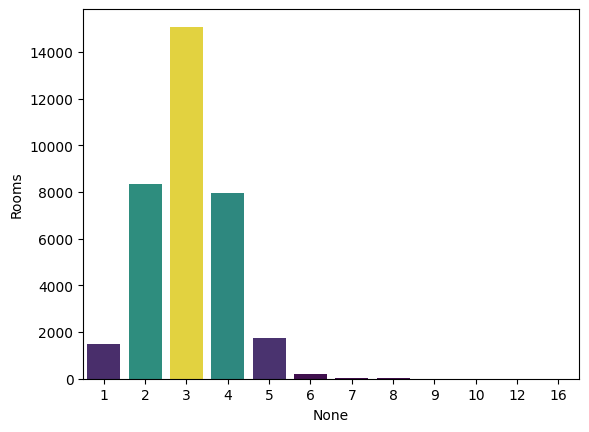

In [ ]:
sns.barplot(y=roomCount, x = label, palette = 'viridis',hue = roomCount, legend =False)

###Type

In [ ]:
typeCount = df['Type'].value_counts(ascending = False)
typeCount

h    23978
u     7296
t     3579
Name: Type, dtype: int64

In [ ]:
sns.barplot(x = typeCount.index, y = typeCount.values, palette = 'pastel',hue = typeCount )

###Type and Price

In [ ]:
meanType = df.groupby(df['Type'])['Price'].agg(['min','max','mean'])

In [ ]:
meanType

###Price


In [ ]:
df['Price'].mean()


In [ ]:
df['Regionname'].unique()

In [ ]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio

# List of regions and corresponding colors
regions = [
    ('All Regions', '#6E6E6E'),
    ('Northern Metropolitan', '#2E9AFE'),
    ('Southern Metropolitan', '#FA5858'),
    ('Eastern Metropolitan', '#81F781'),
    ('Western Metropolitan', '#BE81F7'),
    ('South-Eastern Metropolitan', '#FE9A2E'),
    ('Northern Victoria', '#04B4AE'),
    ('Eastern Victoria', '#088A08'),
    ('Western Victoria', '#8A0886'),
    ('Gaussian Distribution', '#800000')
]

# Create subplots

fig = make_subplots(rows=6, cols=2, subplot_titles=[
    'Overall Price Distribution',
    'Northern Metropolitan',
    'Southern Metropolitan',
    'Eastern Metropolitan',
    'Western Metropolitan',
    'SouthEastern Metropolitan',
    'Northern Victoria',
    'Eastern Victoria',
    'Western Victoria',
    'Gaussian Distribution of Price'
])

# Plot histograms
for i, (region, color) in enumerate(regions, 1):
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1

    if region == 'Gaussian Distribution':
        data = np.log(df['Price'].values)
    else:
        data = df['Price'].loc[df['Regionname'] == region].values
    plt.figure(figsize=(10,10))
    histogram = go.Histogram(x=data, histnorm='probability', name=region, marker=dict(color=color))
    fig.add_trace(histogram, row=row, col=col)

    fig.update_xaxes(title_text='Price', row=row, col=col)
    fig.update_yaxes(title_text='Probability' if region == 'Gaussian Distribution' else 'Count', row=row, col=col)

# Update layout
fig.update_layout(showlegend=False, title="Price Distributions by Region", height=1200, width=800)

# Set hover text
hover_text = ["Region: {}<br>Price: {:.2f}".format(region, value) for region, value in zip(regions, df['Price'])]
fig.update_traces(hoverinfo='text', text=hover_text)

# Show plot
pio.show(fig)


In [ ]:
print(df['Price'].describe().T)

count    3.485300e+04
mean     1.010867e+06
std      5.720244e+05
min      8.500000e+04
25%      6.950000e+05
50%      8.700000e+05
75%      1.150000e+06
max      1.120000e+07
Name: Price, dtype: float64


### YearBuilt


###Methode

In [ ]:
df['Method'].value_counts()

S     19743
SP     5093
PI     4850
VB     3107
SN     1317
PN      308
SA      226
W       173
SS       36
Name: Method, dtype: int64

<ipython-input-39-7546c2a3c837>:1: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



<Axes: xlabel='Method', ylabel='Count'>

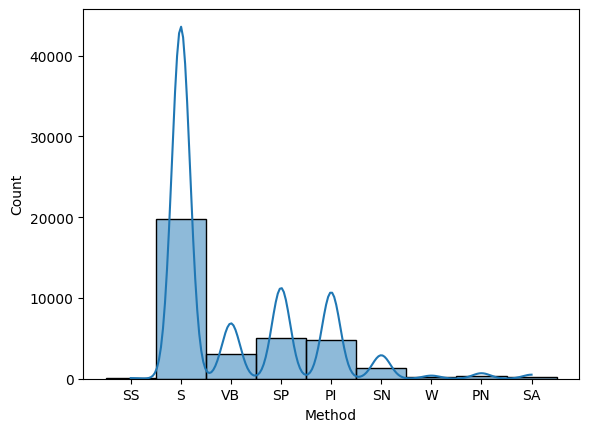

In [ ]:
sns.histplot(data =df,x = 'Method', kde=True, palette = 'pastel')

###Bathroom

In [ ]:
df['Bathroom'].value_counts()

2     19287
1     12969
3      2180
4       269
5        77
0        46
6        16
7         4
8         3
12        1
9         1
Name: Bathroom, dtype: Int64

In [ ]:
sns.histplot(data = df , x='Bathroom', weights=10, bins='auto', palette = 'viridis')

### Numerical

In [ ]:
numeric = df.select_dtypes(include = 'number')
numeric

In [ ]:
numeric.info()

In [ ]:
numeric.corr()

In [ ]:
fig = plt.figure(figsize=(10,5))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=1)
plt.xticks(rotation=45)


### Rooms & Bedroom2

In [ ]:
sns.scatterplot(data = df, x='Bedroom2', y = 'Rooms', hue='Rooms',legend=False,style = 'Rooms')

In [ ]:
df.describe(include = 'O')

### Rooms and Price

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Misalnya, kita ingin melihat scatter plot antara Rooms dan Price
sns.scatterplot(x='Rooms', y='Price', data=df, hue='Rooms')
plt.title('Scatter Plot between Rooms and Price')
plt.show()

In [ ]:
grroupingSubur= df.groupby('Suburb')['Price'].agg(['median', 'sum']).reset_index()
grroupingSubur

### Suburb

In [ ]:
suburb = df['Suburb'].value_counts(ascending=False).head(15)
suburb

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Mendapatkan data harga properti untuk setiap region
regions = ['Northern Metropolitan', 'Southern Metropolitan', 'Eastern Metropolitan',
           'Western Metropolitan', 'South-Eastern Metropolitan', 'Northern Victoria',
           'Eastern Victoria', 'Western Victoria']

region_prices = {}
for region in regions:
    region_prices[region.lower().replace('-', '_')] = df['Price'].loc[df['Regionname'] == region].values

gaussian_distribution = np.log(df['Price'].values)

# Menentukan ukuran subplot
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(15, 20))

# Menggambarkan histogram untuk setiap region
for i, (region, prices) in enumerate(region_prices.items()):
    row = i // 2
    col = i % 2
    sns.histplot(prices, ax=axes[row, col], kde=True, color='skyblue')
    axes[row, col].set_title(f'{region.capitalize()} Price Distribution')
    axes[row, col].set_xlabel('Price')

# Menggambarkan histogram untuk Gaussian Distribution
sns.histplot(gaussian_distribution, ax=axes[5, 0], kde=True, color='salmon')
axes[5, 0].set_title('Gaussian Distribution of Price')
axes[5, 0].set_xlabel('Log(Price)')

# Menyusun layout
plt.tight_layout()
plt.show()


### Date

In [ ]:
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df.head()

#### Season

In [ ]:
def get_season(month):
    if 3 <= month <= 5:
        return 'Spring'
    elif 6 <= month <= 8:
        return 'Summer'
    elif 9 <= month <= 11:
        return 'Autumn'
    else:
        return 'Winter'

df['Season'] = df['Date'].dt.month.apply(get_season)

In [ ]:
df['Season'].unique()

In [ ]:
# Membuat mapping dari angka bulan ke nama bulan
month_mapping = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}


# Menggunakan mapping untuk mendapatkan nama bulan
df['Month Name'] = df['Month'].map(month_mapping)

# Menampilkan DataFrame dengan kolom baru 'Month Name'
print(df[['Date', 'Month', 'Month Name']])


In [ ]:
df['Month Name'] = df['Month'].map(month_mapping)

# Menghitung total penjualan per bulan
sales_by_month = df.groupby('Month Name').size().reset_index(name='Total Sales')

# Mengurutkan DataFrame berdasarkan urutan bulan
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
sales_by_month['Month Name'] = pd.Categorical(sales_by_month['Month Name'], categories=months_order, ordered=True)
sales_by_month = sales_by_month.sort_values('Month Name')

# Membuat plot menggunakan seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='Month Name', y='Total Sales', data=sales_by_month, palette='viridis',)

# Menambahkan label dan judul
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Distribution of Sales by Month')

# Menampilkan plot
plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def month_year_sales(df, month, year):
    return df['Price'].loc[(df['Month'] == month) & (df['Year'] == year)].sum()

years = [2016, 2017, 2018]
months = list(range(1, 13))

# List comprehensions untuk mendapatkan total penjualan setiap bulan untuk setiap tahun
sales_data = [[month_year_sales(df, month, year) for month in months] for year in years]

# Membuat plot untuk setiap tahun
traces = [go.Bar(
    x=months,
    y=sales_data[i],
    name=str(years[i]),
    marker=dict(color=colors[i])
) for i in range(len(years))]

# Membuat subplot
fig = make_subplots(rows=1, cols=1, subplot_titles=["Sales by Month for the Years (2016, 2017, 2018)"])

# Menambahkan plot ke subplot
for trace in traces:
    fig.add_trace(trace)

# Menambahkan label dan judul
fig.update_layout(
    title="Sales by Month for the Years (2016, 2017, 2018)",
    xaxis=dict(title="Months"),
    yaxis=dict(title="Total Sales"),
    showlegend=True,
    legend=dict(x=0, y=1.1),
    height=400,
    width=900
)

# Menampilkan plot
fig.show()


In [ ]:
df.describe().T

### Region

In [ ]:
df['Regionname'].value_counts()

In [79]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install ydata-profiling
from pandas_profiling import ProfileReport
# Membaca DataFrame

# Membuat laporan dengan Pandas Profiling
profile = ProfileReport(df, title=' Report', explorative=True, html={'style': {'full_width':True}},missing_diagrams={'bar': True})

profile.to_notebook_iframe()


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.head()


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Month,Year,Season,Month Name
0,Abbotsford,68 Studley St,2,h,870000.0,SS,Jellis,2016-03-09,2.5,3067,2,1,1,126.0,160.2564,1970,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019,3,2016,Spring,March
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067,2,1,1,202.0,160.2564,1970,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019,3,2016,Spring,March
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067,2,1,0,156.0,79.0000,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019,4,2016,Spring,April
3,Abbotsford,18/659 Victoria St,3,u,870000.0,VB,Rounds,2016-04-02,2.5,3067,3,2,1,0.0,160.2564,1970,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019,4,2016,Spring,April
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067,3,2,0,134.0,150.0000,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019,4,2017,Spring,April
